# Preprocessing
Perform appropriate QC for each of the samples in your dataset separately. In addition to the basic QC metrics, you should utilize a doublet detection tool of your choice.

In [6]:
import scanpy as sc
import anndata as ad
import celltypist
from celltypist import models
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import glob

In [13]:
%%bash
pwd

/projectnb/bf528/students/amuldoon/final-project-n-muldoon


Change file names to be approriate

In [4]:
# List of sample directories
sample_dirs = ['refs/case1_yf', 'refs/case1_zy', 'refs/case2_yf','refs/case2_zc',
'refs/case2_zy', 'refs/case3_yf','refs/case3_zy', 'refs/case4_zy',]  # Add more as needed

# Expected file suffixes
suffixes = {
    'barcodes.tsv.gz': 'barcodes.tsv.gz',
    'features.tsv.gz': 'features.tsv.gz',
    'matrix.mtx.gz': 'matrix.mtx.gz'
}

for sample_dir in sample_dirs:
    for suffix, new_name in suffixes.items():
        # Look for a file in the directory that ends with the expected suffix
        matches = glob.glob(os.path.join(sample_dir, f'*{suffix}'))
        if len(matches) == 1:
            old_path = matches[0]
            new_path = os.path.join(sample_dir, new_name)
            os.rename(old_path, new_path)
            print(f"Renamed: {old_path} → {new_path}")
        else:
            print(f"Warning: Found {len(matches)} matches for '*{suffix}' in {sample_dir}")


Renamed: refs/case1_yf/barcodes.tsv.gz → refs/case1_yf/barcodes.tsv.gz
Renamed: refs/case1_yf/features.tsv.gz → refs/case1_yf/features.tsv.gz
Renamed: refs/case1_yf/matrix.mtx.gz → refs/case1_yf/matrix.mtx.gz
Renamed: refs/case1_zy/barcodes.tsv.gz → refs/case1_zy/barcodes.tsv.gz
Renamed: refs/case1_zy/features.tsv.gz → refs/case1_zy/features.tsv.gz
Renamed: refs/case1_zy/matrix.mtx.gz → refs/case1_zy/matrix.mtx.gz
Renamed: refs/case2_yf/barcodes.tsv.gz → refs/case2_yf/barcodes.tsv.gz
Renamed: refs/case2_yf/features.tsv.gz → refs/case2_yf/features.tsv.gz
Renamed: refs/case2_yf/matrix.mtx.gz → refs/case2_yf/matrix.mtx.gz
Renamed: refs/case2_zc/barcodes.tsv.gz → refs/case2_zc/barcodes.tsv.gz
Renamed: refs/case2_zc/features.tsv.gz → refs/case2_zc/features.tsv.gz
Renamed: refs/case2_zc/matrix.mtx.gz → refs/case2_zc/matrix.mtx.gz
Renamed: refs/case2_zy/barcodes.tsv.gz → refs/case2_zy/barcodes.tsv.gz
Renamed: refs/case2_zy/features.tsv.gz → refs/case2_zy/features.tsv.gz
Renamed: refs/case2_zy

Read in files using scanpy read_10x_mtx funcion

In [3]:
case1_yf = sc.read_10x_mtx('refs/case1_yf/')
case1_zy = sc.read_10x_mtx('refs/case1_zy/')  
case2_yf = sc.read_10x_mtx('refs/case2_yf/')  
case2_zc = sc.read_10x_mtx('refs/case2_zc/')  
case2_zy = sc.read_10x_mtx('refs/case2_zy/')  
case3_yf = sc.read_10x_mtx('refs/case3_yf/')  
case3_zy = sc.read_10x_mtx('refs/case3_zy/')  
case4_zy = sc.read_10x_mtx('refs/case4_zy/')

Quick inspect to make sure each loaded correctly

In [4]:
samples=[case1_yf,  case1_zy,  case2_yf,  case2_zc,  case2_zy,  case3_yf,  case3_zy, case4_zy]
for sample in samples:
    print(sample)

AnnData object with n_obs × n_vars = 21560 × 33538
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 13685 × 33538
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 11786 × 33538
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 6606 × 33538
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 9406 × 33538
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 9379 × 33538
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 8837 × 33538
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 2024 × 33538
    var: 'gene_ids', 'feature_types'


Find genes for mt, ribosomal, and hg genes per barcode for efficient qc

Calculate QC metrics

In [5]:
for sample in samples:
    sample.var["mt"] = sample.var_names.str.startswith("mt-")  # Mitochondrial genes
    sample.var["ribo"] = sample.var_names.str.startswith(("RPS", "RPL"))  # Ribosomal genes
    sample.var["hb"] = sample.var_names.str.contains("^Hb[^(P)]")  # Hemoglobin genes (excluding HbP)

    sc.pp.calculate_qc_metrics(
    sample, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
    )

## Figures

1. Create a plot or plots that contain at minimum information on the number of unique genes detected per barcode, the total number of molecules per barcode, and the percentage of reads that map to the mitochondrial genome.

... storing 'feature_types' as categorical


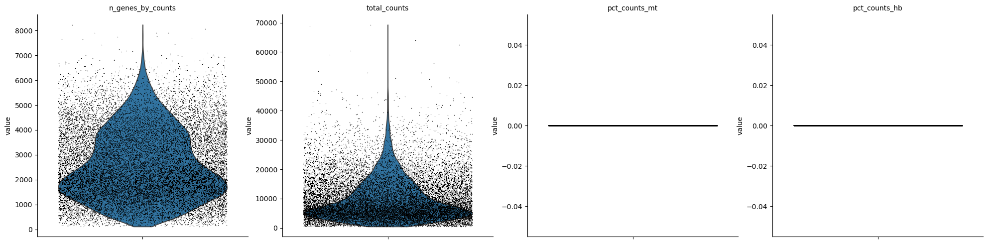

... storing 'feature_types' as categorical


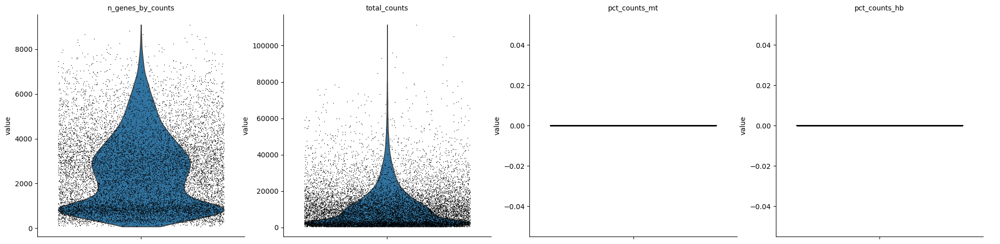

... storing 'feature_types' as categorical


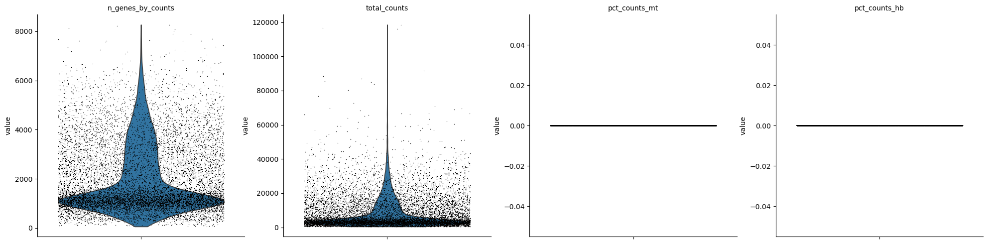

... storing 'feature_types' as categorical


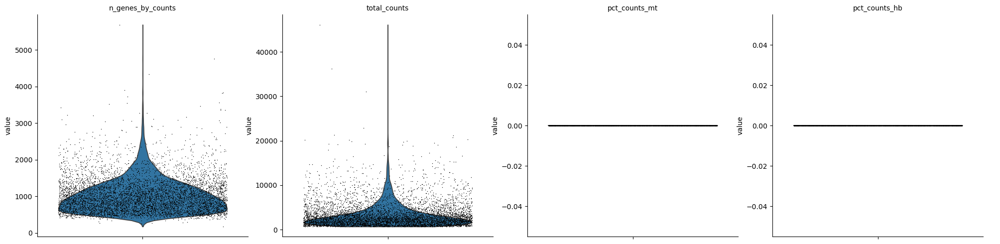

... storing 'feature_types' as categorical


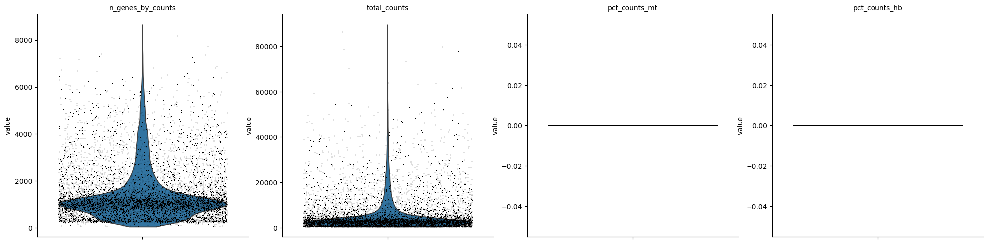

... storing 'feature_types' as categorical


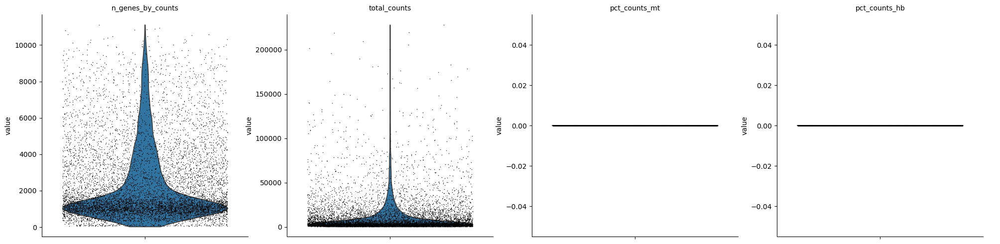

... storing 'feature_types' as categorical


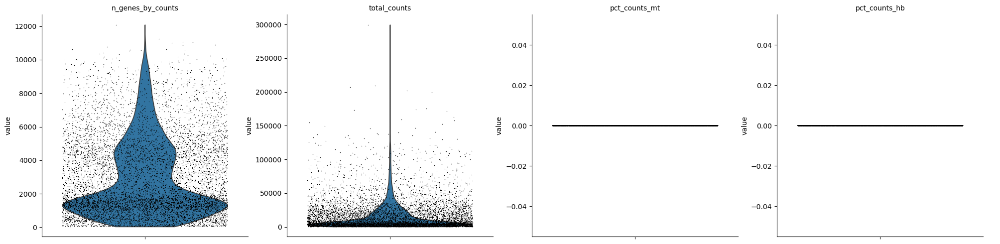

... storing 'feature_types' as categorical


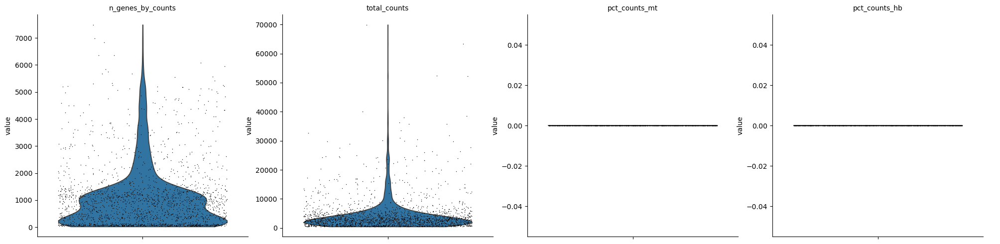

In [6]:
samples=[case1_yf, case1_zy, case2_yf, case2_zc,  
        case2_zy, case3_yf,case3_zy, case4_zy]
for sample in samples:
    sc.pl.violin(
        sample,
        ["n_genes_by_counts", "total_counts", "pct_counts_mt","pct_counts_hb"],
        jitter=0.4,
        multi_panel=True,
    )

2. An integrated plot that visualizes the above metrics jointly for each sample.

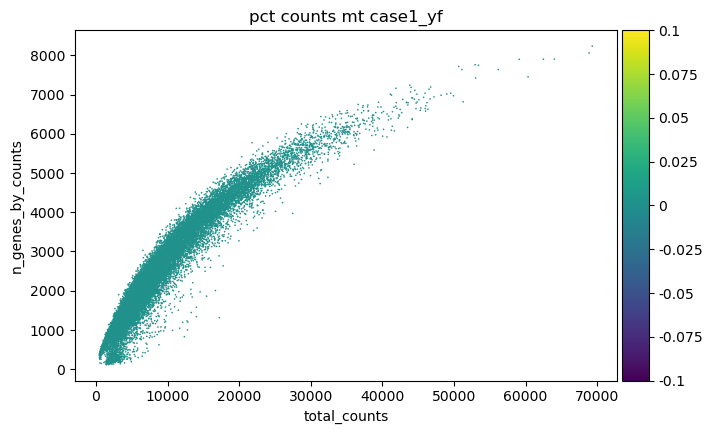

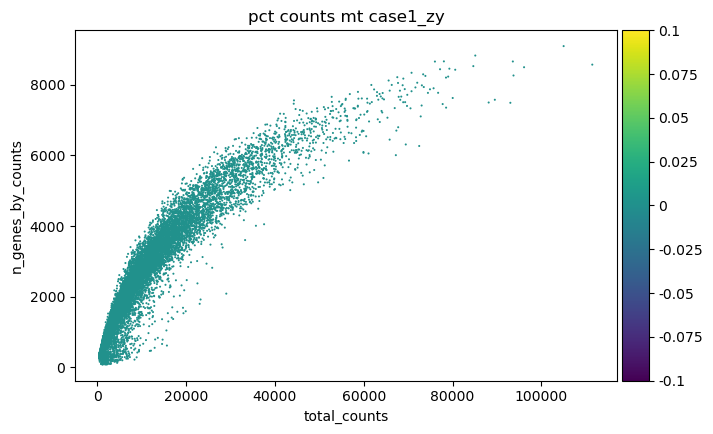

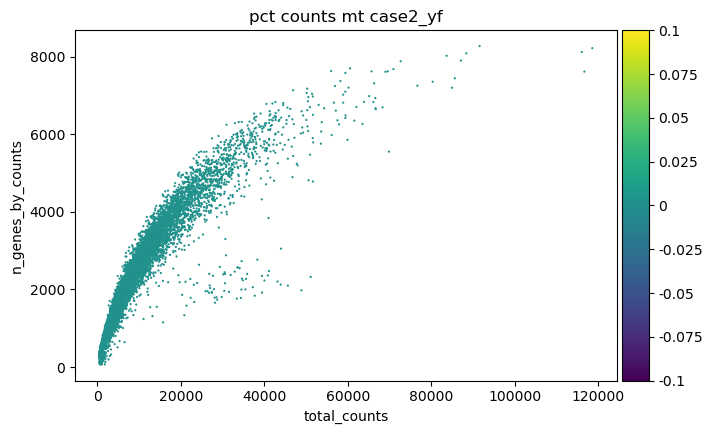

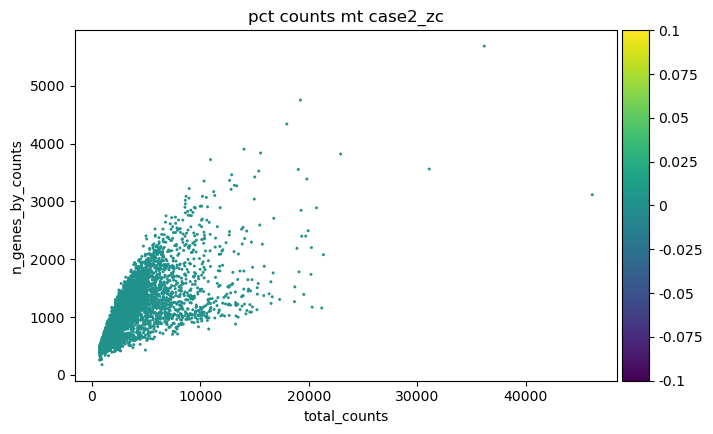

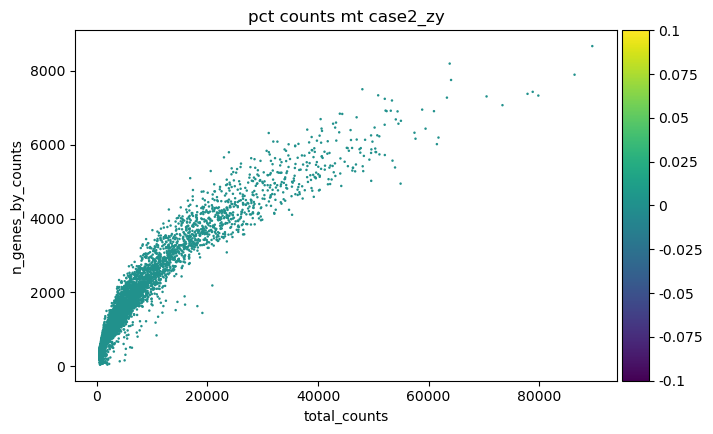

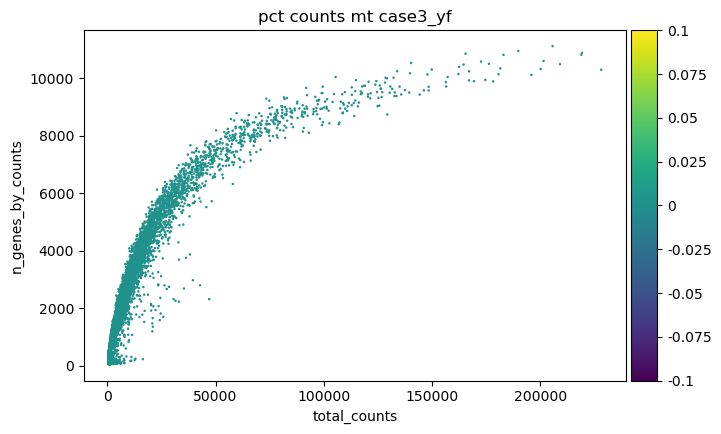

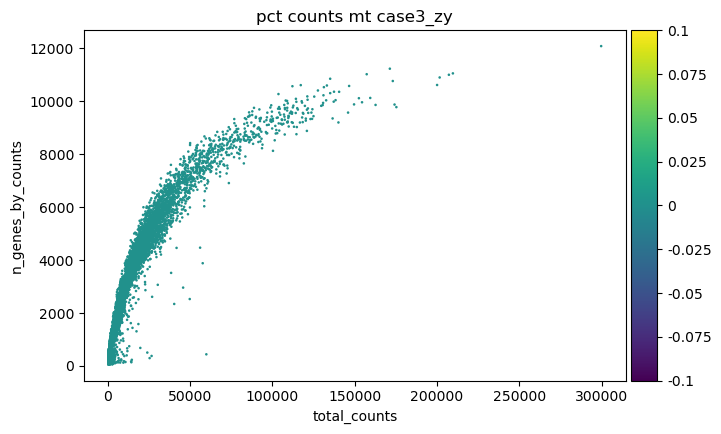

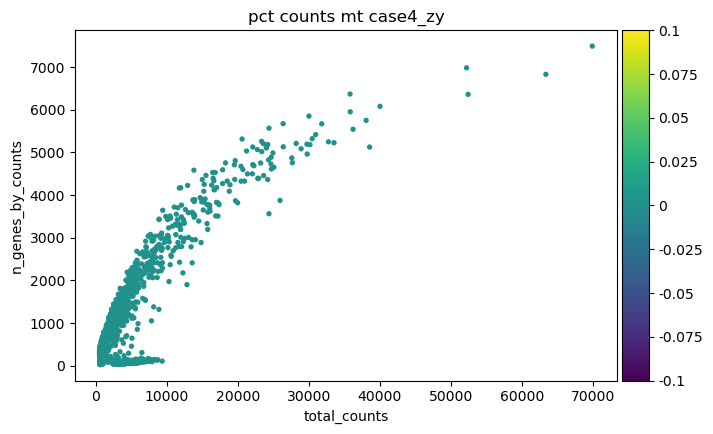

In [9]:
samples=[case1_yf, case1_zy, case2_yf, case2_zc,  
        case2_zy, case3_yf,case3_zy, case4_zy]
titles=['case1_yf', 'case1_zy', 'case2_yf', 'case2_zc',  
        'case2_zy','case3_yf','case3_zy', 'case4_zy']
for sample, title in zip(samples, titles): #for sample in samples, title in titles
    sc.pl.scatter(sample, "total_counts", "n_genes_by_counts", 
    color="pct_counts_mt", title=f'pct counts mt {title}')

Filtering based on default (permissive) thresholds

Manually set threshold for scrublet b/c scikit-image cannot be installed on scc

3. Results from the doublet detection algorithm you employed

In [7]:
for sample in samples:
    sc.pp.filter_cells(sample, min_genes=100)
    sc.pp.filter_genes(sample, min_cells=3)
    sc.pp.scrublet(sample,threshold=0.25)
    print(sample)

AnnData object with n_obs × n_vars = 21560 × 21640
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet'
AnnData object with n_obs × n_vars = 13672 × 21572
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt'

4. Create a table that displays how many cells / genes are present in your dataset before and after your filtering thresholds are implemented

In [11]:
titles=['case1_yf', 'case1_zy', 'case2_yf', 'case2_zy',  
        'case3_yf','case3_zy','case2_zc', 'case4_zy']
samples=[case1_yf, case1_zy, case2_yf, case2_zy,  
        case3_yf,case3_zy,case2_zc, case4_zy]      
prefiltered_cells = {
    'case1_yf': 21560,
    'case1_zy': 13685,
    'case2_yf': 11786,
    'case2_zc': 6606,
    'case2_zy': 9406,
    'case3_yf': 9379,
    'case3_zy': 8837,
    'case4_zy': 2024
}
i=0
for sample, title in zip(samples, titles):
    pre_cell = prefiltered_cells[title]
    post_cell = sample.n_obs
    pre_gene = 33538
    post_gene = sample.n_vars
    if i==0:
        print('Sample    '+'\t'+'Cells Before'+'\t'+'Cells After'+'\t'+'Genes Before'+'\t'+'Genes After')
        i+=1
    print(f"{title}\t{pre_cell}\t\t{post_cell}\t\t{pre_gene}\t\t{post_gene}")


Sample    	Cells Before	Cells After	Genes Before	Genes After
case1_yf	21560		21560		33538		21640
case1_zy	13685		13672		33538		21572
case2_yf	11786		11774		33538		21715
case2_zy	9406		9388		33538		22523
case3_yf	9379		9291		33538		22668
case3_zy	8837		8704		33538		22971
case2_zc	6606		6606		33538		18492
case4_zy	2024		1653		33538		16498


## Discussion:
What filtering thresholds did you choose and how did you decide on them?

- I used the default thresholds of min_genes=100, min_cells=3 because the scanpy tutorial suggested this as the default, and I figured since the dataset was relatively unknown to me it would be better at this stage to be permissive and if necccassary, to later make it more restrictive.

How many cells / genes are present before and after implementing your filtering thresholds?

- Total cells across all samples before filtering was 83,283 cells, and after fltering was 82,648. Total genes for each sample before filtering was 33,538, and the exact count for each sample can be found in the table above, but generally most cases reduced in gene count by around 10,000 genes, except for case2_zc and case4_zy, which reduced by almost half.

Look in the literature, what are some potential strategies to set thresholds that don’t rely on visual inspection of plots?

- Setting a threshold manually, which I did, which relies on ...

# Normalization: 
The normalization method chosen normalizes each cell's gene count by the total count over all genes.

In [11]:
#combine into 1 anndata object
titles=['case1_yf', 'case1_zy', 'case2_yf', 'case2_zy',  
        'case3_yf','case3_zy','case2_zc', 'case4_zy']
adata = ad.concat(samples, join='outer', label="sample", keys=titles)
#checking shape/counts look correct
print(adata.shape) #cells x gene
print(adata.obs['sample'].value_counts()) #cells/sample


(82648, 25875)
sample
case1_yf    21560
case1_zy    13672
case2_yf    11774
case3_yf     9388
case3_zy     9291
case2_zc     8704
case2_zy     6606
case4_zy     1653
Name: count, dtype: int64


In [14]:
adata.write('results/adata_concat.h5ad')

In [2]:
adata = sc.read('results/adata_concat.h5ad')
adata_celltypist = adata.copy() #copy for annotation later
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

# Feature Selection: 
Top 2000 genes like used in the paper
## Figures
Create a plot of the highly variable features by your chosen metric.

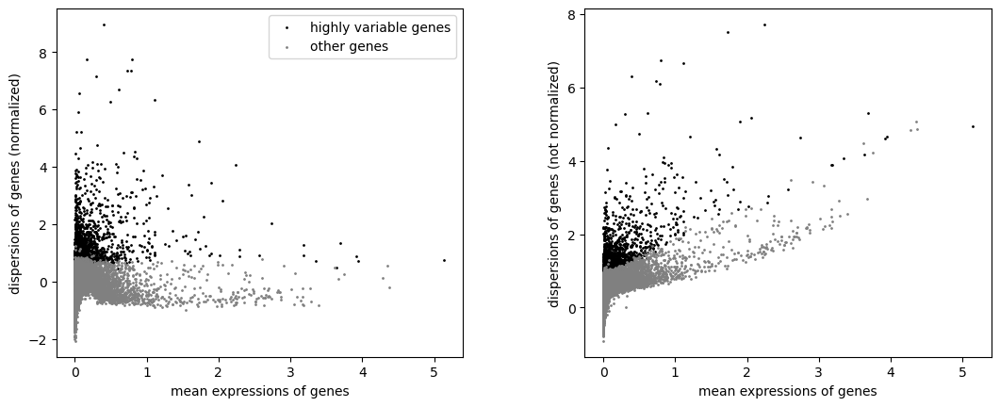

In [3]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="sample")
sc.pl.highly_variable_genes(adata)

In [6]:
highly_variable_count = adata.var['highly_variable'].value_counts()
print(highly_variable_count)

highly_variable
False    23875
True      2000
Name: count, dtype: int64



## Discussion
Explain the method used to determine highly variable features and report how many variable features you chose to use for downstream dimensional reduction.

- The default flavor of sc.pp.highly_variable_genes is 'seurat,' thus it follows the feature selection method used in seurat. This is done by first calculating most varible genes, then calculating a mean dispersion (variance/mean) for each gene across all cells, binningg genes, and normalized each bin to mean expression. The top 2000 variable features were selected for downstream dimensional reduction 

Include a brief statement on how many genes meet your chosen threshold to be considered highly variable and how many are not considered
- 2000 genes were considered highly variable, and 23875 genes were considered not highly variable

# PCA
## Figures
Create a plot that justifies your choice of how many PCs to utilize in downstream analyses

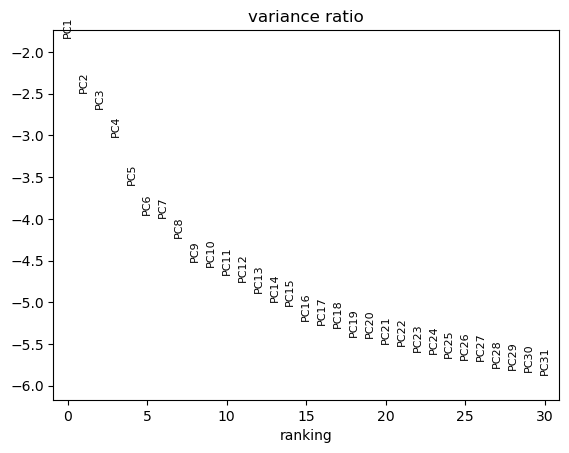

/projectnb/bf528/students/amuldoon/.conda/envs/final_env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


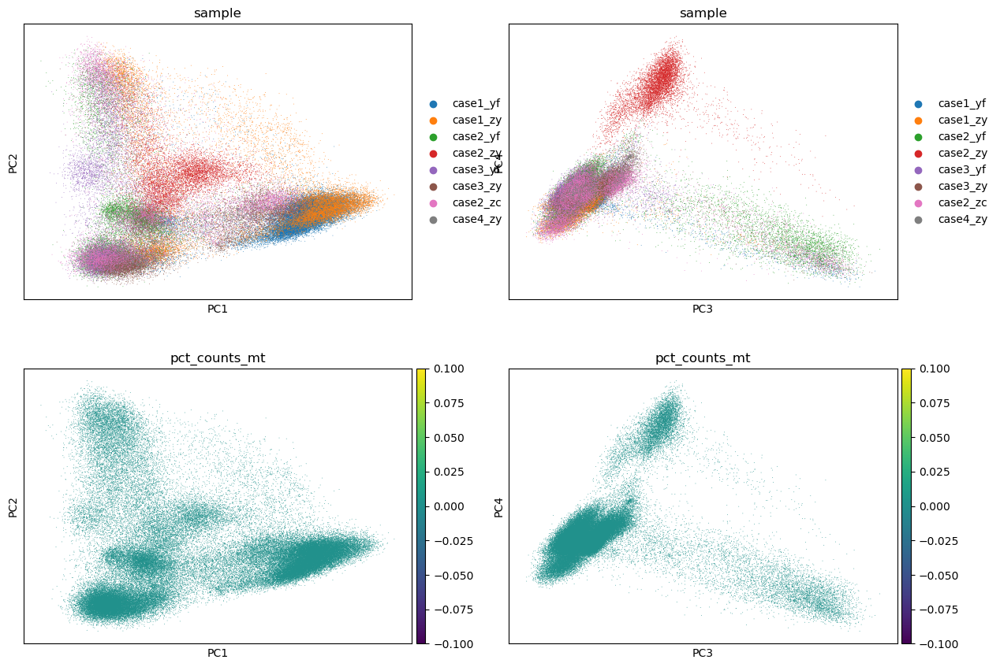

In [4]:
sc.tl.pca(adata)
sc.pl.pca_variance_ratio(adata, n_pcs=30, log=True)
sc.pp.neighbors(adata)
sc.pl.pca(
    adata,
    color=["sample", "sample", "pct_counts_mt", "pct_counts_mt"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
)

## Discussion
Justify your choice in writing and briefly remark on your plot.
- The first PCA plot shows that a PC number of 16 would capture most of the variance in the datase, which is a good cutoff for when the slope strarts to straaighten out and less variance is explined by each preceding principal component. One could be more consrvative and set PC=30, but I don't think it's necessry in this case.

# Clustering and visualization
## Figures


Create a plot visualizing the clustering results of your cells. Ensure that it has labels that identify which samples each cell originated from.

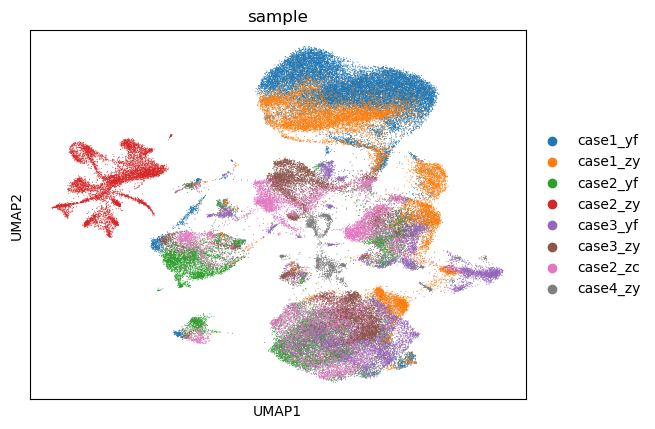

In [5]:
sc.tl.umap(adata, random_state=5)
sc.pl.umap(
    adata,
    color="sample",
    size=2,
)

Create a plot visualizing the clustering results of your cells. Ensure that it has labels that identify the different clusters as determined by the unsupervised clustering method you employed

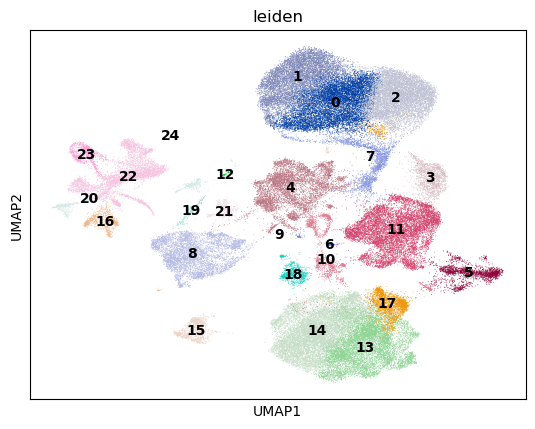

In [6]:
sc.tl.leiden(adata, flavor="igraph", n_iterations=2,random_state=5,resolution=0.5)
sc.pl.umap(adata, color=["leiden"], legend_loc='on data')

In [7]:
adata.obs[['leiden']].to_csv("results/leiden_clusters.csv")


## Discussion
Write a brief paragraph describing the results up to this point. In it, ensure that you include the following information:

How many cells come from each sample individually? How many total cells present in the entire dataset?
How many clusters are present?
What clustering resolution did you use?

- After loading in the 10x matrix data objects and inspecting each sample, there are case1_yf: 21560 cells,case1_zy: 13685 cells, case2_yf: 11786 cells, case2_zy: 9406 cells, case3_yf: 9379 cells, case3_zy: 8837 cells, case2_zc: 6606 cells, and case4_zy: 2024 cells. Total cell count across all samples was 83,283 cells. After performing quality control, filtering, normalization by total count, and selecting the top 2000 most variable genes, principal commponent analysis and clustering was performed. Using the unsupervised igraph clustering with 0.5, 22 clusters were found.  

Use the second plot you created and briefly remark on whether you will perform integration.
- Looking at the UMAP plot colored by sample, I am not going to perform integration because it visually looks like the clusters are not grouped by sample, except for case2_zy. Considering it is the only sample that seems to be isolated, I don't think it's worth it to do integration.


# Marker Gene Analysis

## Figures
Create a table listing the top five marker genes for each of your clusters

In [9]:
leiden_clusters = pd.read_csv("results/leiden_clusters.csv", index_col=0)

In [10]:
print(adata.obs_names[:5])
print(leiden_clusters.index[:5])

Index(['AAACCCAAGAGCACTG-1', 'AAACCCAAGCTAATCC-1', 'AAACCCAAGGCTGTAG-1',
       'AAACCCAAGTTGAATG-1', 'AAACCCACAAACAGGC-1'],
      dtype='object')
Index(['AAACCCAAGAGCACTG-1', 'AAACCCAAGCTAATCC-1', 'AAACCCAAGGCTGTAG-1',
       'AAACCCAAGTTGAATG-1', 'AAACCCACAAACAGGC-1'],
      dtype='object')


In [11]:
adata.obs['leiden'] = adata.obs['leiden'].astype('category')

In [12]:
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon")

/projectnb/bf528/students/amuldoon/.conda/envs/final_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/projectnb/bf528/students/amuldoon/.conda/envs/final_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/projectnb/bf528/students/amuldoon/.conda/envs/final_env/lib/python

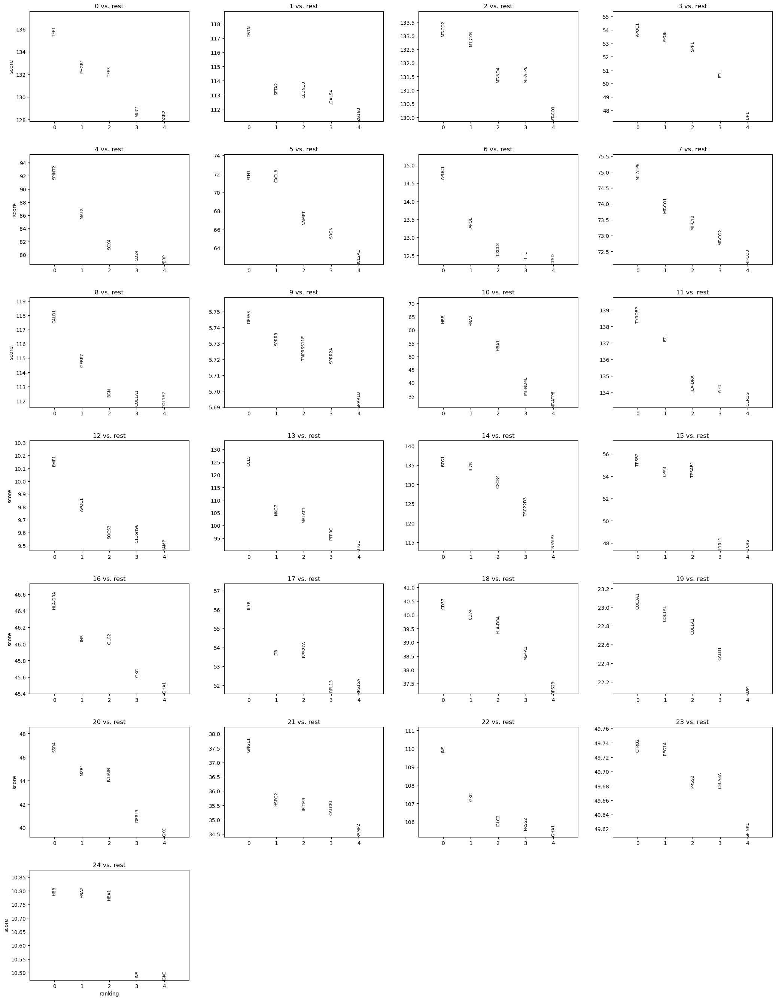

In [13]:
sc.pl.rank_genes_groups(adata, n_genes=5, sharey=False)

In [15]:

df = sc.get.rank_genes_groups_df(adata, group=None)
top5_per_cluster = df.groupby("group").head(5)
top5_per_cluster.to_csv("results/top5_marker_genes_per_cluster.csv", index=False)

In [16]:
top5_per_cluster = pd.read_csv("results/top5_marker_genes_per_cluster.csv")

In [17]:
top5_per_cluster

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,TFF1,135.334080,4.644911,0.000000e+00,0.000000e+00
1,0,PHGR1,132.130970,4.101808,0.000000e+00,0.000000e+00
2,0,TFF3,131.804950,4.166267,0.000000e+00,0.000000e+00
3,0,MUC1,128.281040,3.676027,0.000000e+00,0.000000e+00
4,0,AGR2,127.860020,3.594605,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...
120,24,HBB,10.783109,13.026868,4.136654e-27,4.308534e-23
121,24,HBA2,10.775140,12.080128,4.510950e-27,4.308534e-23
122,24,HBA1,10.765748,10.855543,4.995402e-27,4.308534e-23
123,24,INS,10.482904,7.689528,1.035159e-25,5.936102e-22


## Discussion
Briefly describe the method performed to identify marker genes. Discuss a few advantages and disadvantages of the method used to perform marker gene analysis.

The method used to perform marker gene analysis. was the wilconxon method, which uses the Wilcoxon rank sum. I used this because it is the default method, it is used for non-parametric data which is best for single-cell data and sparse data. The general downside of the Wilcoxon rank sum is that it is not good at taking into other covariaates or batch effects. However, generally the data did not cluster based on sample type. That is not to say there are other potential covariates hidden in the data that by using the Wilcoxon rank sum test, we are failing to take into account for the model.

In [18]:
adata_celltypist.layers["counts"] = adata_celltypist.X.copy()
sc.pp.normalize_total(adata_celltypist, target_sum=10000)
sc.pp.log1p(adata_celltypist)
adata_celltypist.obs_names_make_unique()
adata_celltypist.var_names_make_unique()

In [19]:
#models.models_description()

In [20]:
predictions = celltypist.annotate(adata_celltypist, model = 'Immune_All_Low.pkl', majority_voting = True)

🔬 Input data has 82648 cells and 25875 genes
🔗 Matching reference genes in the model
🧬 5851 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [21]:
predictions.predicted_labels

,predicted_labels,over_clustering,majority_voting
AAACCCAAGAGCACTG-1,Epithelial cells,133,Epithelial cells
AAACCCAAGCTAATCC-1,Epithelial cells,94,Epithelial cells
AAACCCAAGGCTGTAG-1,Epithelial cells,19,Epithelial cells
AAACCCAAGTTGAATG-1,Epithelial cells,115,Epithelial cells
AAACCCACAAACAGGC-1,Epithelial cells,24,Epithelial cells
...,...,...,...
TTTGGAGCAACTTGGT-1,Monocytes,314,Intermediate macrophages
TTTGGAGCAGTTCCAA-1,Tem/Trm cytotoxic T cells,27,Tem/Trm cytotoxic T cells
TTTGTTGAGGGCAGTT-1,Tcm/Naive helper T cells,145,Tcm/Naive helper T cells
TTTGTTGCAAGTGCAG-1,Memory B cells,145,Tcm/Naive helper T cells


In [22]:
#new attempt
adata.obs = adata.obs.join(predictions.predicted_labels)

In [23]:
adata.write('results/clustered_annotated_adata.h5ad')

In [24]:
adata = sc.read('results/clustered_annotated_adata.h5ad')

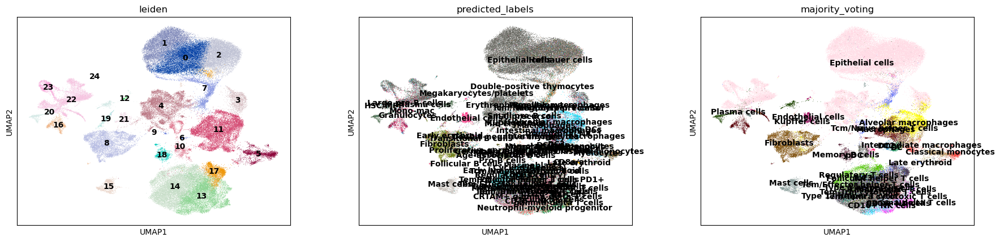

In [44]:
sc.pl.umap(adata, color = ['leiden', 'predicted_labels','majority_voting'], legend_loc='on data')

In [161]:
#going to try to look cleaner
label_mapping = {
    'Tcm/Naive helper T cells': 'T cells',
    'Trm cytotoxic T cells': 'T cells',
    'Tem/Trm cytotoxic T cells': 'T cells',
    'gamma-delta T cells': 'T cells',
    'Regulatory T cells': 'T cells',
    'Tcm/Naive cytotoxic T cells': 'T cells',
    'CRTAM+ gamma-delta T cells': 'T cells',
    'Type 1 helper T cells': 'T cells',
    'Follicular helper T cells': 'T cells',
    'Tem/Temra cytotoxic T cells': 'T cells',
    'Tem/Effector helper T cells': 'T cells',
    'Type 17 helper T cells':  'T cells',
    'Memory CD4+ cytotoxic T cells': 'T cells',
    'Cycling T cells': 'T cells',
    'T(agonist)': 'T cells',
    'NKT cells': 'T cells',
    'Early lymphoid/T lymphoid': 'T cells',
    'MAIT cells': 'T cells',
    'Tem/Effector helper T cells PD1+': 'T cells',
    'Transitional B cells': 'B cells',
    'Pro-B cells': 'B cells',
    'Naive B cells': 'B cells',
    'Memory B cells': 'B cells',
    'Germinal center B cells': 'B cells',
    'Proliferative germinal center B cells': 'B cells',
    'Follicular B cells': 'B cells',
    'CD16- NK cells': 'NK cells',
    'CD16+ NK cells': 'NK cells',
    'Cycling NK cells': 'NK cells',
    'Transitional NK': 'NK cells',
    'Alveolar macrophages': 'Macrophages',
    'Intermediate macrophages': 'Macrophages',
    'Intestinal macrophages': 'Macrophages',
    'Kupffer cells': 'Macrophages',
    'Hofbauer cells': 'Epithelial cells',
    'Classical monocytes':'Monocytes',
    'Non-classical monocytes':'Monocytes',
    'Early erythroid':'Erythroids',
    'Mid erythroid':'Erythroids',
    'Late erythroid':'Erythroids',
    'Erythrophagocytic macrophages':'Macrophages',
    'Treg(diff)':'T cells',
    'DC':'DCs',
    'DC2':'DCs',
    'DC precursor':'DCs',
    'DC1':'DCs',
    'Monocyte precursor':'Monocytes',
    'Migratory DCs':'DCs',
    'Age-associated B cells':'B cells',
    'Large pre-B cells':'B cells',
    'Small pre-B cells':'B. cells',
    'Cycling DCs':'DCs',
    'DC3':'DCs',
    # '':'Myelocytes',
    # '':'',
    # '':'',
    # '':'',
    # '':'',
    # '':'',
    # Add more mappings as needed
}
adata.obs['broad_labels'] = adata.obs['predicted_labels'].replace(label_mapping)
adata.obs['broad_labels'] = adata.obs['broad_labels'].astype('category')
for item in adata.obs['broad_labels'].unique():
    print(item)

Epithelial cells
T cells
Plasma cells
Double-positive thymocytes
Mast cells
Fibroblasts
Macrophages
NK cells
Monocytes
B cells
DCs
ILC3
CD8a/b(entry)
Endothelial cells
Double-negative thymocytes
Myelocytes
ILC
Plasmablasts
Megakaryocytes/platelets
Erythroids
Mono-mac
CD8a/a
ETP
pDC
MNP
HSC/MPP
Granulocytes
Neutrophil-myeloid progenitor
B. cells
ILC precursor
ILC2
Promyelocytes
Neutrophils


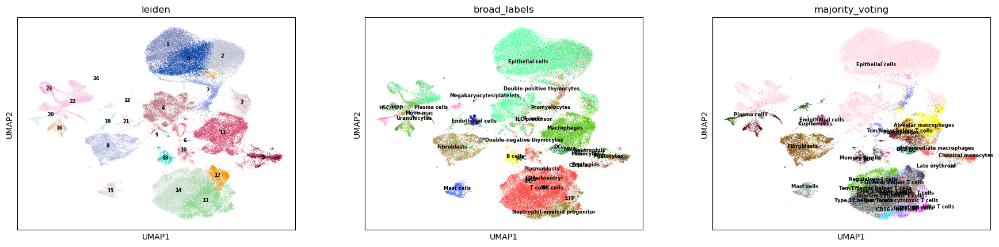

In [162]:
sc.pl.umap(adata, color = ['leiden', 'broad_labels','majority_voting'], legend_loc='on data',legend_fontsize=6)

## Discussion
Briefly remark on how the algorithm works and ensure you cite the original publication. You may paraphrase information from the publication.
- The Teichmann Lab developed celltypist to annotate cell-types for scRNA-seq datasets. It primarily uses logistic regression to classify cell types, and is optimized foor large datasets (which often one handles in scRNA-seq experiments.)

Comment on the cell identities of your clusters and any speculation as to the original source tissue of the samples based on what you see.
- One of the most distinct cell clusters seen is epithelial cells. Because of the clustering pattern, it is difficult to see the actual words of the other clusters. However, memory B cells, fibroblasts,, and many other immune cells are seen. The immune cells are likely from the tumor microenvironment, as there would be a lot of immune activity in this region.

References
Automatic cell-type harmonization and integration across Human Cell Atlas datasets. Cell 186, 5876–5891.e20 (2023). DOI: 10.1016/j.cell.2023.11.026 

Cross-tissue immune cell analysis reveals tissue-specific features in humans. Science 376, eabl5197 (2022). DOI: 10.1016/j.cell.2023.11.026 

# Manual Cluster Labeling

In [26]:
top_genes_df=pd.read_csv('results/top5_marker_genes_per_cluster.csv')

In [27]:
print(top_genes_df.head())

   group  names     scores  logfoldchanges  pvals  pvals_adj
0      0   TFF1  135.33408        4.644911    0.0        0.0
1      0  PHGR1  132.13097        4.101808    0.0        0.0
2      0   TFF3  131.80495        4.166267    0.0        0.0
3      0   MUC1  128.28104        3.676027    0.0        0.0
4      0   AGR2  127.86002        3.594605    0.0        0.0


In [28]:
print(adata.obs['leiden'].unique())

['0', '1', '2', '4', '7', ..., '6', '12', '24', '10', '9']
Length: 25
Categories (25, object): ['0', '1', '2', '3', ..., '21', '22', '23', '24']


In [66]:
print(adata.obs['leiden'].dtype)

category


In [36]:
# Convert to a dict: cluster → list of top 5 genes
top_genes_dict = {
    str(k): v for k, v in (
        top_genes_df.groupby("group")["names"]
        .apply(list)
        .to_dict()
        .items()
    )
}


top_genes_dict


{'0': ['TFF1', 'PHGR1', 'TFF3', 'MUC1', 'AGR2'],
 '1': ['DSTN', 'SFTA2', 'CLDN18', 'LGALS4', 'ZG16B'],
 '2': ['MT-CO2', 'MT-CYB', 'MT-ND4', 'MT-ATP6', 'MT-CO1'],
 '3': ['APOC1', 'APOE', 'SPP1', 'FTL', 'FBP1'],
 '4': ['SPINT2', 'MAL2', 'SOX4', 'CD24', 'PERP'],
 '5': ['FTH1', 'CXCL8', 'NAMPT', 'SRGN', 'BCL2A1'],
 '6': ['APOC1', 'APOE', 'CXCL8', 'FTL', 'CTSD'],
 '7': ['MT-ATP6', 'MT-CO1', 'MT-CYB', 'MT-CO2', 'MT-CO3'],
 '8': ['CALD1', 'IGFBP7', 'BGN', 'COL1A1', 'COL1A2'],
 '9': ['DEFA3', 'SPRR3', 'TMPRSS11E', 'SPRR2A', 'SPRR1B'],
 '10': ['HBB', 'HBA2', 'HBA1', 'MT-ND4L', 'MT-ATP8'],
 '11': ['TYROBP', 'FTL', 'HLA-DRA', 'AIF1', 'FCER1G'],
 '12': ['EMP1', 'APOC1', 'SOCS3', 'C11orf96', 'HAMP'],
 '13': ['CCL5', 'NKG7', 'MALAT1', 'PTPRC', 'BTG1'],
 '14': ['BTG1', 'IL7R', 'CXCR4', 'TSC22D3', 'TNFAIP3'],
 '15': ['TPSB2', 'CPA3', 'TPSAB1', 'IL1RL1', 'LTC4S'],
 '16': ['HLA-DRA', 'INS', 'IGLC2', 'IGKC', 'IGHA1'],
 '17': ['IL7R', 'LTB', 'RPS27A', 'RPL13', 'RPS15A'],
 '18': ['CD37', 'CD74', 'HLA-DRA',

## Figures
Create a single plot / figure that displays the top marker genes for every cluster in your dataset. This plot may be in any style (a heatmap, a tracksplot, violin plot, etc.)

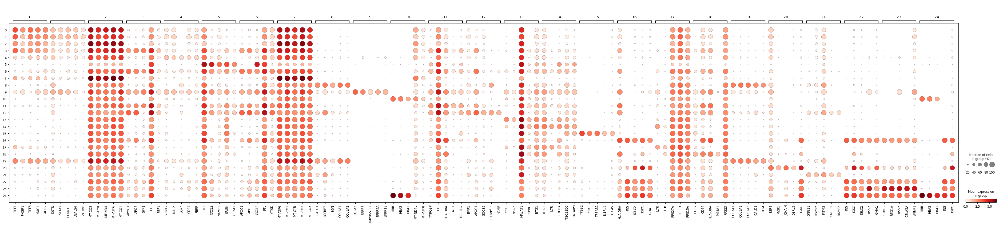

In [37]:
sc.pl.dotplot(
    adata,
    var_names=top_genes_dict,
    groupby="leiden",  # or whatever your cluster key is
    show=True
)

For the top three clusters with the most cells, create individual plots of at least 5 of the defining marker genes for that cluster and their expression compared across all clusters

Cluster 14
![cluster14_top5_gene_expression_vs_all_clusters](results/cluster14_top5_gene_expression_vs_all_clusters.png)

Cluster 0
![cluster0_top5_gene_expression_vs_all_clusters](results/cluster0_top5_gene_expression_vs_all_clusters.png)

Cluster 2
![cluster2_top5_gene_expression_vs_all_clusters](results/cluster2_top5_gene_expression_vs_all_clusters.png)

In [38]:
cluster_counts = adata.obs['leiden'].value_counts()
top3_clusters = cluster_counts.head(3)
print(top3_clusters)

leiden
14    11118
0      9155
2      8398
Name: count, dtype: int64


In [39]:
top_clusters = top3_clusters.index.astype(str).tolist()  # Convert to strings

top_genes = {}
for cluster in top_clusters:
    genes = sc.get.rank_genes_groups_df(adata, group=cluster)['names'].head(5).tolist()
    top_genes[cluster] = genes


Plotting Cluster 14


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

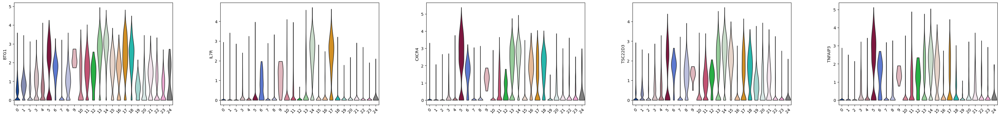

Plotting Cluster 0


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

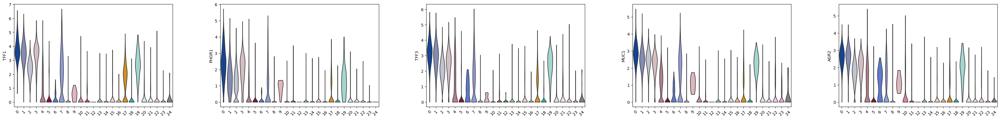

Plotting Cluster 2


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

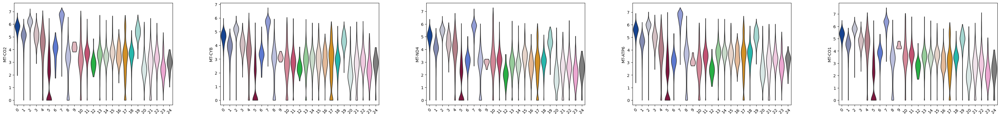

In [40]:
for cluster, genes in top_genes.items():
    print(f"Plotting Cluster {cluster}")
    sc.pl.violin(
        adata,
        keys=genes,
        groupby='leiden',
        stripplot=False,
        jitter=False,
        rotation=45,
        show=True
    )


Create a visualization / plot of your clusters with your manual annotations and labels of cell identities.

In [42]:
# get top 100 genes for each cluster
df = sc.get.rank_genes_groups_df(adata, group=None)
top100_per_cluster = df.groupby("group").head(100)
top100_per_cluster.to_csv("results/top100_marker_genes_per_cluster.csv", index=False)

In [43]:
top100_per_cluster=pd.read_csv('results/top100_marker_genes_per_cluster.csv')

In [58]:
#for each cluster:
    # put into David
    # filter for terms where at least one of top5 genes for that cluster in the genes listed
    # look through, find pattern
manual_annotations = {
    "0": "GI epithelial cells",
    "1": "epithelial cells",
    "2": "epithelial cells",
    "3": "epithelial cells",
    "4": "epithelial cells",
    "5": "monocytes",
    "6": "epithelial cells",
    "7": "epithelial cells",
    "8": "fibroblasts",
    "9": "stratified squamous epithelia",
    "10": "RBCs",
    "11": "APCs",
    "12": "hepatic cells - immune response",
    "13": "T cells",
    "14": "T cells",
    "15": "mast cells",
    "16": "plasma cells",
    "17": "T cells",
    "18": "APCs",
    "19": "fibroblasts",
    "20": "plasma cells",
    "21": "epithelial cells",
    "22": "plasma cells",
    "23": "pancreatic cells",
    "24": "RBCs"
}


In [56]:
print(adata.obs['leiden'].index)

Index(['AAACCCAAGAGCACTG-1', 'AAACCCAAGCTAATCC-1', 'AAACCCAAGGCTGTAG-1',
       'AAACCCAAGTTGAATG-1', 'AAACCCACAAACAGGC-1', 'AAACCCACAACTAGAA-1',
       'AAACCCAGTAAGGCTG-1', 'AAACCCAGTACGATCT-1', 'AAACCCAGTACTCGAT-1',
       'AAACCCAGTATCGAAA-1',
       ...
       'TTTCGATGTCGAAACG-1', 'TTTCGATGTTCATCGA-1', 'TTTGACTTCCATCCGT-1',
       'TTTGATCGTACTCGCG-1', 'TTTGATCGTCACTGAT-1', 'TTTGGAGCAACTTGGT-1',
       'TTTGGAGCAGTTCCAA-1', 'TTTGTTGAGGGCAGTT-1', 'TTTGTTGCAAGTGCAG-1',
       'TTTGTTGGTGTCTTAG-1'],
      dtype='object', length=82648)


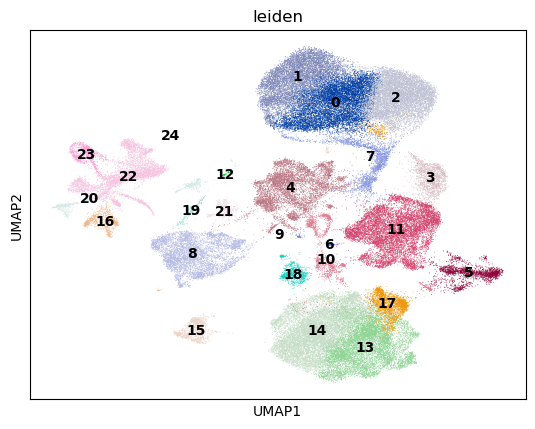

In [54]:
sc.pl.umap(adata, color = ['leiden'], legend_loc='on data')
# adata.obs['majority_voting']
# print(adata.obs['leiden'].index)

... storing 'manual_labels' as categorical


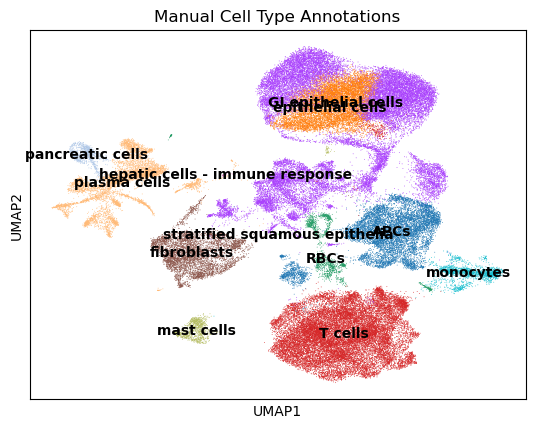

In [64]:
adata.obs['manual_labels'] = adata.obs['leiden'].map(manual_annotations)
sc.pl.umap(adata, color='manual_labels', legend_loc='on data', title='Manual Cell Type Annotations')


## Discussion

Write a paragraph describing your cell annotations and explaining what cell label you have assigned to each cluster. Ensure that you have at least one citation that supports your labeling and choice of marker genes for each cluster.

The process I used to manually annotate the cells was to first look at the dotplot for the top 5 genes for each cluster and the mean expression compaared to the other clusters. For certain clusters, this identified unique gene expression that necessarily relayed the cell type (like the HBB genes), while for other clusters helped point out gnes that were present in every cluster at high expression, thus not providing information on the unique cell type identity (such. as. the ribosomal proteins). For more general genes, I used the top 100 rank genes for the cluster, put it into DAVID, and looked at the output results that were significant aand had at least one of the top 5 ranked genes iin the gene list for the term. Then, I looked for terms with a similar pattern, confirmed the potential cell identity of the cell given the terms using citations, and annotated the clusters.

Cluster 0:
https://www.ebi.ac.uk/interpro/entry/InterPro/IPR017957/ - P-type trefoil, conserved site (gastrointestinal motility and gastric acid secretion, mucos epithelia)
- 5 terms with trefoil proteins
https://www.ebi.ac.uk/QuickGO/term/GO:0030277 - maintenaance of gastric epithelium

Cluster 1:
https://www.ncbi.nlm.nih.gov/gene/11034 - DSTN (epithelial cells)

Cluster 2:
https://kb.10xgenomics.com/hc/en-us/articles/360001086611-Why-do-I-see-a-high-level-of-mitochondrial-gene-expression - Top5 are mitochindrial
- assuming low quality, thus keeping consistent w/automatic (epithelial cells)

Cluster 3:
https://www.ebi.ac.uk/QuickGO/term/GO:0070062 - extracellular exosomes
- ignored FTL1 b/c present in all clusters at high level
- lots of enrichment in general terms for all of the clusters - thus concluding epithelia cells

Cluster 4:
https://www.uniprot.org/keywords/KW-0965 - cell junction (epithelial cells)
- very general and similar terms to cluster 1

Cluster 5:
https://omim.org/entry/123886 - S100A9 (monocytes)
- ignore FTH1 b/c present in all clusters at high levels

Cluster 6:
https://www.ebi.ac.uk/QuickGO/term/GO:0070062 - (epithelial cells)
- almost exact same expression pattern in similar genes as cluster 3

Cluster 7:
https://kb.10xgenomics.com/hc/en-us/articles/360001086611-Why-do-I-see-a-high-level-of-mitochondrial-gene-expression - mitochondrial again (epithelial cells)
- almost exact same expression pattern in similar genes as cluster 2

Cluster 8:
https://www.sciencedirect.com/science/article/abs/pii/S0006291X22008543 - COL1A/COL1A2 (fibroblasts)
- similaar expression to cluster 19

Cluster 9:
https://www.jbc.org/article/S0021-9258(19)67061-4/fulltext - SPRR family (stratified squamous epithelia)
- uunique expression from dotplot

Cluster 10:
https://www.ncbi.nlm.nih.gov/gene/3043 - HBB, HBA2, HBA1 (RBCs)

Cluster 11:
https://www.ebi.ac.uk/QuickGO/term/GO:0019886 - antigen presenting cells

Clusster 12:
https://www.uniprot.org/uniprotkb/P02656/entry - APOC 3
https://www.uniprot.org/uniprotkb/O14543/entry - SOCS3 (hepatic cells - immune response)

Cluuster 13:
https://www.gsea-msigdb.org/gsea/msigdb/cards/BIOCARTA_TCRA_PATHWAY - Tcells

Cluster 14:
https://www.uniprot.org/uniprotkb/P16871/entry - IL7R (T cells)

Cluster 15:
https://www.uniprot.org/uniprotkb/P20231/entry - TPSB2 (mast cells)

Cluster 16:
https://www.uniprot.org/uniprotkb/P0DOY2/entry - IGLC2,IGKC,IGHA1 (plasma cells)
-  looks similar to cluster 22 & 23

Cluster 17:
https://www.uniprot.org/uniprotkb/P16871/entry - IL7R (T cells)
- RPS27A, RPL13, RPS15A present in all genes

Cluster 18:
https://www.uniprot.org/uniprotkb/P01903/entry - HLA-DRA (APCs)

Cluster 19:
https://www.sciencedirect.com/science/article/abs/pii/S0006291X22008543 - COL1A/COL1A2 (fibroblasts)
- similar expression to cluster 8

Cluster 20:
https://www.uniprot.org/uniprotkb/Q8WU39/entry - MZB1 (plasma cells)

Cluster 21:
https://www.uniprot.org/uniprotkb/O60895/entry - RAMP2 (epithelial cells)
- all general functions

Clusster 22: 
https://www.uniprot.org/uniprotkb/P0DOY2/entry - IGKC, IGLC2 (plasma cells)

Cluster 23:
https://www.ncbi.nlm.nih.gov/gene/440387 - CTRB2 (pancreatic cells)

Cluster 24:
https://www.ncbi.nlm.nih.gov/gene/3043 - HBB, HBA2, HBA1 (RBCs)

# Replicate two of the major findings / analyses from the publication
## Figures

In [66]:
# Sample codes:
# ZC: normal pancreatic tissue
# YF: pancreatic tumors
# ZY: hepatic metastases
#make afunction to assign coondition so able to apply it
def add_conditions(sample):
    if 'yf' in sample:
        return 'tumor'
    elif 'zy' in sample:
        return 'metastatic'
    elif 'zc' in sample:
        return 'normal'
    else:
        return 'Unknown'

adata.obs['condition']=adata.obs['sample'].apply(add_conditions)

In [115]:
adata.write('results/adata_own_annotated_conditions.h5ad')

In [7]:
adata = sc.read('results/adata_own_annotated_conditions.h5ad')

In [117]:
adata.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,...,over_clustering,majority_voting,manual_annotations,manual_labels,condition,dpt_pseudotime,dpt_state,dpt_groups,dpt_order,dpt_order_indices
AAACCCAAGAGCACTG-1,946,6.853299,4039.0,8.304000,72.072295,76.206982,81.158703,88.957663,0.0,0.0,...,133,Epithelial cells,Unknown,GI epithelial cells,tumor,0.145345,S1,2,74983,7962
AAACCCAAGCTAATCC-1,4845,8.485909,20821.0,9.943766,32.635320,40.881802,49.824696,61.942270,0.0,0.0,...,94,Epithelial cells,Unknown,epithelial cells,tumor,0.148359,S1,2,76485,25869
AAACCCAAGGCTGTAG-1,3575,8.182000,12284.0,9.416134,27.727125,37.577336,48.632367,63.082058,0.0,0.0,...,19,Epithelial cells,Unknown,epithelial cells,tumor,0.148860,S1,2,76686,29044
AAACCCAAGTTGAATG-1,1062,6.968850,3451.0,8.146709,62.967256,68.154158,74.152420,83.714865,0.0,0.0,...,115,Epithelial cells,Unknown,epithelial cells,tumor,0.136934,S1,0,57580,59836
AAACCCACAAACAGGC-1,1772,7.480428,4832.0,8.483223,30.132450,43.687914,56.436258,71.750828,0.0,0.0,...,24,Epithelial cells,Unknown,epithelial cells,tumor,0.092850,S1,0,14347,23097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCAACTTGGT-1,344,5.843544,759.0,6.633318,54.413702,67.588933,81.027668,100.000000,0.0,0.0,...,314,Intermediate macrophages,Unknown,monocytes,metastatic,0.023770,S1,0,294,53280
TTTGGAGCAGTTCCAA-1,1090,6.994850,2748.0,7.918993,36.608443,48.871907,61.972344,78.529840,0.0,0.0,...,27,Tem/Trm cytotoxic T cells,Unknown,RBCs,metastatic,0.111950,S1,0,39387,48108
TTTGTTGAGGGCAGTT-1,338,5.826000,868.0,6.767343,66.820276,72.580645,84.101382,100.000000,0.0,0.0,...,145,Tcm/Naive helper T cells,Unknown,RBCs,metastatic,0.086260,S1,0,9064,52318
TTTGTTGCAAGTGCAG-1,309,5.736572,572.0,6.350886,44.405594,62.587413,80.944056,100.000000,0.0,0.0,...,145,Tcm/Naive helper T cells,Unknown,RBCs,metastatic,0.091060,S1,0,13136,47859


1e. Bar plot showing the cell type abundance for samples from different groups, as measured by scRNA-seq data in this study or deconvoluted bulk RNA-seq data from Yang et al.12. 

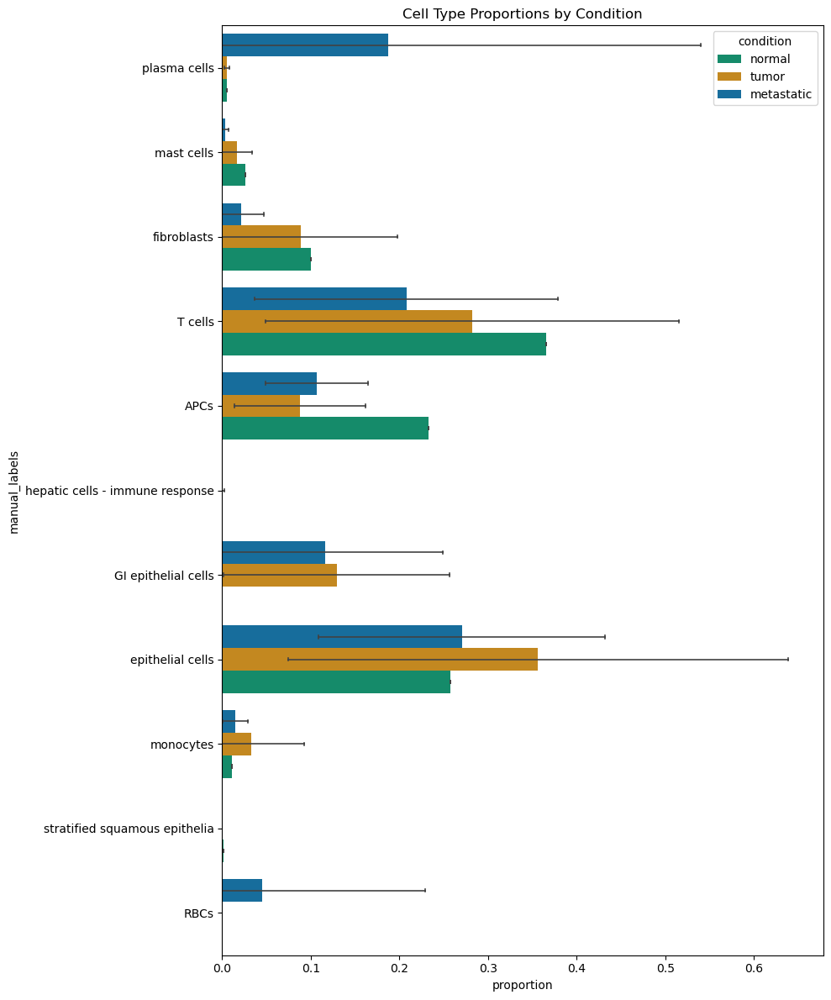

In [95]:

# to keep desired order
condition_order = ['metastatic','tumor', 'normal']
adata.obs['condition'] = pd.Categorical(adata.obs['condition'], categories=condition_order, ordered=True)

# count cells per cell type per sample
cell_counts = adata.obs.groupby(['sample', 'manual_labels']).size().unstack(fill_value=0)

#. normalize per sample (row-wise)
cell_props = cell_counts.div(cell_counts.sum(axis=1), axis=0)
cell_props = cell_props.fillna(0)  # Fill any NaN values (which occur if a row sum is zero)

# add condition column to cell_props
cell_props = cell_props.reset_index()
cell_props = cell_props.merge(adata.obs[['sample', 'condition']], on='sample', how='left')

cell_type_order = [
    'plasma cells', 
    'mast cells', 
    'fibroblasts', 
    'T cells',
    "APCs",
    "hepatic cells - immune response",
    "GI epithelial cells",
    "epithelial cells",
    "monocytes",
    "stratified squamous epithelia",
    "RBCs"
]
# need to melt structure in. order to plot
cell_props_melted = cell_props.melt(id_vars=['sample', 'condition'], 
                                    var_name='manual_labels', 
                                    value_name='proportion')
#vertical. barplot
plt.figure(figsize=(10, 12))
ax = sns.barplot(data=cell_props_melted, 
                y='manual_labels', 
                x='proportion', 
                hue='condition', 
                palette='colorblind',
                ci='sd',  # This is causing the negative values
                capsize=0.1, 
                errwidth=1.2,
                order=cell_type_order)

# Set the x-axis to start at 0
ax.set_xlim(left=0)  # This ensures the x-axis starts at 0
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], title='condition')
plt.title("Cell Type Proportions by Condition")
plt.tight_layout()
plt.show()


## Discussion: Cell Proportion Analysis
Write a paragraph per analysis that highlights the top results discovered and includes at least one citation per analysis that represents a potential interpretation or hypothesis from the results.

Zhang et al conclude from Figure 1e that the proportion of the different cell types is in accordance with their immunofluorescence staining experiments. Differences between the two plots mostly originate from different methods to annotate the cell clusters, specifically manual annotation using top ranked genes and DAVID was used in this anlysis while Zhang and colleagues identified marker genes for each predicted cell type, and annotated based on expression of these genes per cluster. The only clear similarities are in the proprtions of the mast cells and the plasma cells. One of the major reasons for mismatch between epithelial and endotheelil cell type proportions is that the paper considered cells highly expressing genes such as 'EPCAM' as ductal cells rather than epithelial, leading to differrence in cell counts per cell type. Although most of the cell types follow the expected proportions of more cells from the normal condition,, then next in tumor, then metastatic. However, it is interesting to note that there seems to be very little amount of normal cells in the GI epithelial cell type category. An interesting further analysis could also be done to investigate the increase in monocyte cell types in tumor samples versus normal or metastatic. This suggests monocytes perhaps play a significant role in tumorigenesis or cell rercruitment to the TME. This pattern was also observed by Hansen et al, who consider using circulting monocytes as a biomarker for PDAC diagnosis.

Hansen FJ, David P, Akram M, et al. Circulating Monocytes Serve as Novel Prognostic Biomarker in Pancreatic Ductal Adenocarcinoma Patients. Cancers (Basel). 2023;15(2):363. Published 2023 Jan 5. doi:10.3390/cancers15020363

## Figure: Supplementary Figure 2a

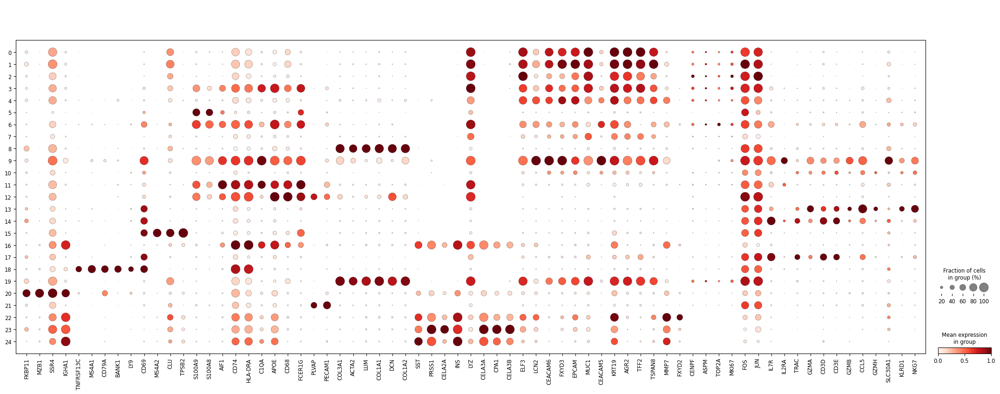

In [8]:
#need. to change annotations to match their ductal cell ones
#using gene list from Supp Fig 1c to help

marker_genes = [
    "FKBP11", "MZB1", "SSR4", "IGHA1", "TNFRSF13C", "MS4A1", "CD79A", "BANK1", "LY9", "CD69",
    "MS4A2", "CLU", "TPSB2", "S100A9", "S100A8", "AIF1", "CD74", "HLA-DRA", "C1QA", "APOE",
    "CD68", "FCER1G", "PLVAP", "PECAM1", "COL3A1", "ACTA2", "LUM", "COL1A1", "DCN", "COL1A2",
    "SST", "PRSS1", "CELA2A", "INS", "LYZ", "CELA3A", "CPA1", "CELA3B", "ELF3", "LCN2", 
    "CEACAM6", "FXYD3", "EPCAM", "MUC1", "CEACAM5", "KRT19", "AGR2", "TFF2", "TSPAN8", 
    "MMP7", "FXYD2", "CENPF", "ASPM", "TOP2A", "MKI67", "FOS", "JUN", "IL7R", "IL2RA",
    "TRAC", "GZMA", "CD3D", "CD3E", "GZMB", "CCL5", "GZMH", "SLC30A1", "KLRD1", "NKG7"
]

# check genes are in your dataset
genes_present = [gene for gene in marker_genes if gene in adata.var_names]

# dotplot
sc.pl.dotplot(
    adata,
    var_names=genes_present,
    groupby="leiden",  
    standard_scale="var",  
    show=True
)


In [9]:
#their marker gene list

In [22]:
#make annotations according to their "marker gene list"
#comparing my dtplot to their heatmap, checking maarker gene cell type
papers_annotations = {
    "0": "ductal cell", #changed
    "1": "T cell", #changed
    "2": "T cell", #changed
    "3": "ductal cell",
    "4": "ductal cell",
    "5": "Mac/Mono",
    "6": "MK167+", #changed
    "7": "ductal cell",
    "8": "fibroblasts", #changed
    "9": "ductal cell", #changed
    "10": "T cell",
    "11": "Mac/Mono",
    "12": "Mac/Mono",
    "13": "NK", #changed
    "14": "NK", #changed
    "15": "mast cells",
    "16": "Mac/Mono", #changed
    "17": "T cells", #changed
    "18": "B cells",
    "19": "fibroblasts", #changed
    "20": "plasma cells",
    "21": "endothelial cells", #changed
    "22": "ductal cell", #changed
    "23": "acinar cell", #changedd
    "24": "endocrine cell" #changed
}

... storing 'paper_labels' as categorical


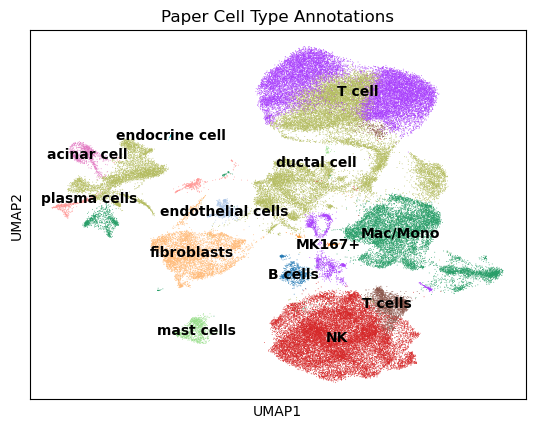

In [23]:
adata.obs['paper_labels'] = adata.obs['leiden'].map(papers_annotations)
sc.pl.umap(adata, color='paper_labels', legend_loc='on data', title='Paper Cell Type Annotations')

According to Zhang et al:

Of note, like ductal cells, we found that the majority of the MKI67+ cell cluster co-expressed the classical epithelial cell marker EPCAM (Fig. 2a), suggesting that the annotated MKI67+ cells are also of ductal origin. We therefore considered both EPCAM+ cells and MKI67+ cells as ductal cells and identified a total of 10,014 ductal cells from all 8 samples. The ductal cells were further divided into 6 subclusters through re-clustering analysis, including RPS3+, TFF1+, CEACAM6+, CEACAM5+, MALAT1+, and MKI67+ ductal cells, defined by a unique subset of highly expressed genes in each subcluster 

In [109]:
#subset ductal cell clusters; reddefine MK167+ as ductal cells
#EPCAM+ cells now ductal cells

#instead of redefining that cluster; consider any highly expressed MK167 cells as ductal cells
mki67_check = adata[:, 'MKI67'].X.toarray().flatten()
print(max(mki67_check))
print(np.mean(mki67_check))

mask_mki67_positive = adata[:, 'MKI67'].X.toarray().flatten() > 1

2.360983
0.046729892


In [110]:
epcam_check = adata[:, 'EPCAM'].X.toarray().flatten()
print(max(epcam_check))
print(np.mean(epcam_check))

#looked at dotplot, epcam pretty distinct, thus not going to make it too restrictice
#maake threshold for cell to be considered 'epcam+' to be > avg
mask_epcam_positive = adata[:, 'EPCAM'].X.toarray().flatten() > 0.55

2.7494783
0.32112944


In [111]:
combined_mask = mask_mki67_cluster | mask_epcam_positive
adata_ductal = adata[combined_mask].copy()

In [112]:
adata_ductal

AnnData object with n_obs × n_vars = 29222 × 25875
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'sample', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'manual_annotations', 'manual_labels', 'condition', 'dpt_pseudotime', 'dpt_state', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'paper_labels'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'diffmap_evals', 'dpt_changepoints', 'dpt_grouptips', 'dpt_state_colors', 'hvg', 'iroot', 'leiden', 'leiden_colors', 'log1p', 'ma

need to re-preprocess


In [113]:
adata_ductal.layers["counts"] = adata_ductal.X.copy()
sc.pp.normalize_total(adata_ductal)
sc.pp.log1p(adata_ductal)

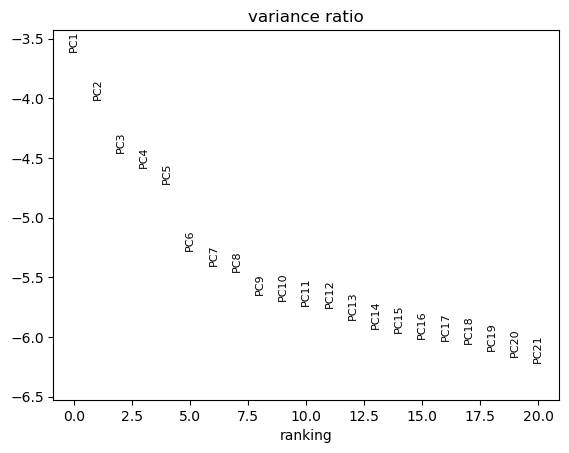

In [114]:
adata_ductal = adata_ductal[:, adata.var_names]
sc.pp.scale(adata_ductal)
sc.tl.pca(adata_ductal)
sc.pl.pca_variance_ratio(adata_ductal, n_pcs=20, log=True)
sc.pp.neighbors(adata_ductal)
sc.tl.umap(adata_ductal, random_state=5)
sc.tl.leiden(adata_ductal, flavor="igraph", n_iterations=2,random_state=5,resolution=0.5)

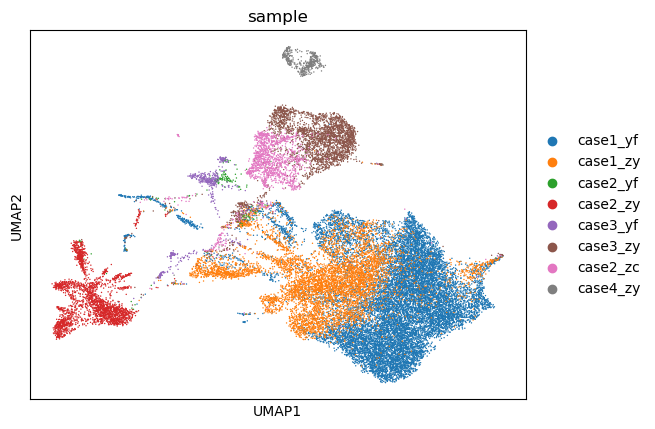

In [115]:
sc.pl.umap(adata_ductal, color='sample')

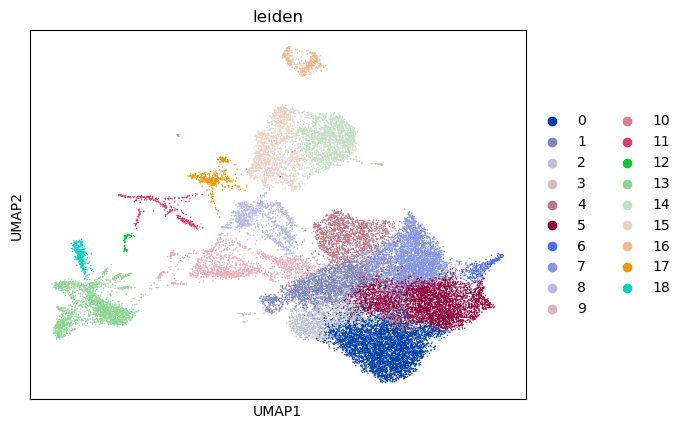

In [116]:
sc.pl.umap(adata_ductal, color='leiden')

In [118]:
adata_ductal.obs['leiden'] = adata_ductal.obs['leiden'].astype('category')

In [119]:
sc.tl.rank_genes_groups(adata_ductal, groupby="leiden", method="wilcoxon")

In [123]:
top_adata_ductal_genes = sc.get.rank_genes_groups_df(adata_ductal, group=None)
top100_per_ductal = top_adata_ductal_genes.groupby("group").head(100)
top100_per_ductal.to_csv("results/top100_marker_genes_per_ductal.csv", index=False)

In [127]:
top100_per_ductal = pd.read_csv("results/top100_marker_genes_per_ductal.csv")

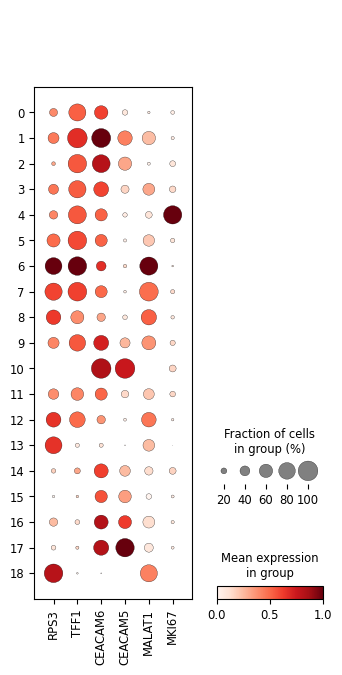

In [129]:
marker_genes = [
    'RPS3','TFF1', 'CEACAM6', 'CEACAM5', 'MALAT1', 'MKI67'
]

# Ensure genes are in your dataset
genes_present = [gene for gene in marker_genes if gene in adata_ductal.var_names]

# Create dotplot
sc.pl.dotplot(
    adata_ductal,
    var_names=genes_present,
    groupby="leiden",  # Replace with your actual clustering key if different
    standard_scale="var",  # Optional: standardizes expression
    show=True
)

In [130]:
ductal_annotations = {
    "0": "CEACAM6+", #changed
    "1": "CEACAM6+", #changed
    "2": "CEACAM6+", #changed
    "3": "CEACAM6+",
    "4":  "MKI67+",
    "5": "TFF1+",
    "6": "MALAT1+", #changed
    "7": "TFF1+",
    "8": "RPS3+", #changed
    "9": "CEACAM6+", #changed
    "10": "CEACAM6+",
    "11": "CEACAM6+",
    "12": "RPS3+",
    "13": "RPS3+", #changed
    "14": "CEACAM6+", #changed
    "15": "CEACAM6+",
    "16": "CEACAM6+", #changed
    "17": "CEACAM5+", #changed
    "18": "RPS3+"
}

... storing 'ductal_labels' as categorical


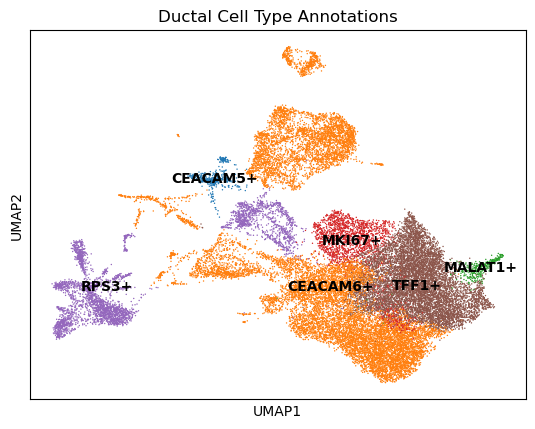

In [134]:
adata_ductal.obs['ductal_labels'] = adata_ductal.obs['leiden'].map(ductal_annotations)
sc.pl.umap(adata_ductal, color='ductal_labels', legend_loc='on data', title='Ductal Cell Type Annotations')

In [135]:
# pseudotime analysis using scanpy
sc.tl.diffmap(adata_ductal)
#set branch according to paper's cluster lookiinig like root is cluster 4
root_cell = adata_ductal[adata_ductal.obs['leiden'] == '4'].obs_names[0]
adata_ductal.uns['iroot'] = adata_ductal.obs_names.get_loc(root_cell)
sc.tl.dpt(adata_ductal,n_branchings=1)

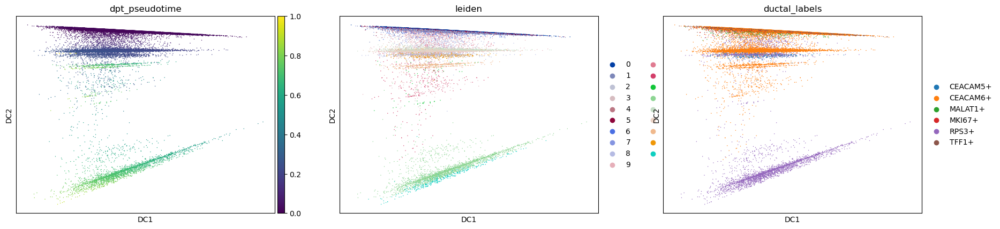

In [136]:
sc.pl.diffmap(adata_ductal, color=['dpt_pseudotime', 'leiden','ductal_labels'])

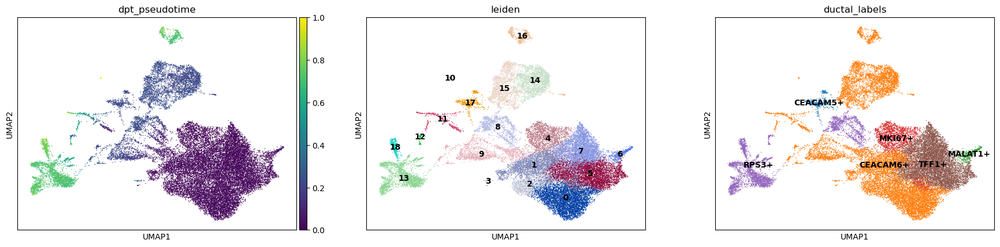

In [141]:
sc.pl.umap(adata_ductal, color=['dpt_pseudotime', 'leiden','ductal_labels'],legend_loc='on data')

## Discussion

Write a paragraph per analysis that highlights the top results discovered and includes at least one citation per analysis that represents a potential interpretation or hypothesis from the results.

First, annotations according to Zhang et al's method was performed in order to get cell type annotations that resemble theirs. This was done by manually comparing the dotplot for this analysis and heatmap from their analysis data in terms of the marker genes listed in the heatmap (Supp. Figure 1c). After applying their cell annotations to our data, we filtered for ductal cells by subsetting the data for cells that had an above average EPCAM expreession or if expression was over 1.0 for MKI67. This resulted in 29,222 cells, which is 19,000 more ductal cells than Zhang et al found. Data preprocessing and clustering was performed on the subset data, with the number of PCs sete to 20 in. the pca_variance_ratio functino and the reslution for the leiden function being set to 0.5. This was done to reduce numbere of clusters, as Zhang et al reported only 6 clusters, while even with these parameters 18 clusters were found. The genes were ranked forr each cluster, and the top 100 genes per cluster were used to allow for cell annotation using the listed marker genes and the ductal cell dotplot. Afte manually annotating cell type using the dotplot, pseudotime analysis was perfomed and the root cell was set to the 'MKI67' cluster like in the paper,  and the number of branchings was set to 1. The resulting umap. of the pseudotimes somewhat resemmbled Zhang et al's conclusions. One of the reasons it was different is likely the annotatioon method I used, as Zhang et al did not clarify and only stated they "divided [the ductal clls] into 6 subclusters through re-clustering analysis, including RPS3+, TFF1+, CEACAM6+, CEACAM5+, MALAT1+, and MKI67+ ductal cells, defined by a unique subset of highly expressed genes in each subcluster (Fig. 2a, b, Supplementary Fig. 2 and Supplementary Data 2)." Another reason is perhaps using the subsetted data object, which was previously preprocessed and log-normalized. Thus, perhaps double preprocessing added noise to the data and prevented a clear signal from being seen. Interestingly, CEACAM5+ is located in the intermediate pseudotime area, with the CEACAM6+ in the later stage, however the clusters from cell type to pseudotime do not seem to overlap. A major reason for this is likely in the subjective annotating process because as seen in the dotplot, CEACAM 6 and CEACAM5 often co-occur, and thus it ws subjective decision making the resulted in choosing which clusters had which cell type. Considering this, it would be interesting to look into if CEACAM5 is more present in the transitory state and if that has consequences regarding diagnosis or treatment of PDAC. Shi, Tsang, and Yang further this theory by suggesting CEACAM5 is stemness-related immune-checkpoint inhibitor.

Shi H, Tsang Y, Yang Y. Identification of CEACAM5 as a stemness-related inhibitory immune checkpoint in pancreatic cancer. BMC Cancer. 2022;22(1):1291. Published 2022 Dec 9. doi:10.1186/s12885-022-10397-7

# Analysis of your choice that was not performed in the publication
Briefly remark on the results and why they may be interesting. Provide at least one citation from the literature that represents a potential hypothesis or point of interest from the results you show.

In [168]:
# pathway analysis of cluster 5 RGS5+ myCAF
adata_fibroblasts = adata[adata.obs['broad_labels'] == 'Fibroblasts'].copy()
rgs5_check = adata[:, 'RGS5'].X.toarray().flatten()
print(max(rgs5_check))
print(np.mean(rgs5_check))

mask_rgs5_positive = adata[:, 'RGS5'].X.toarray().flatten() > 1
adata_fibroblasts = adata[mask_rgs5_positive].copy()

2.4023297
0.010481787


In [169]:
adata_fibroblasts

AnnData object with n_obs × n_vars = 286 × 25875
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'sample', 'leiden', 'predicted_labels', 'over_clustering', 'majority_voting', 'manual_annotations', 'manual_labels', 'condition', 'dpt_pseudotime', 'dpt_state', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'paper_labels', 'broad_labels'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'diffmap_evals', 'dpt_changepoints', 'dpt_grouptips', 'dpt_state_colors', 'hvg', 'iroot', 'leiden', 'leiden_colors'

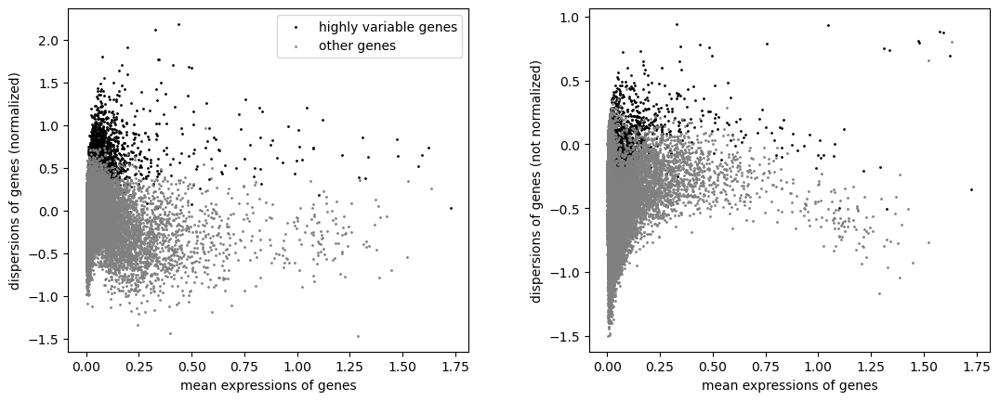

In [173]:
#25,875 genes; going to need to rank them
#take top 1 for each cell = 286 genes
sc.pp.highly_variable_genes(adata_fibroblasts, n_top_genes=2000, batch_key="sample")
sc.pl.highly_variable_genes(adata_fibroblasts)

In [174]:
sc.tl.pca(adata_fibroblasts)
sc.pp.neighbors(adata_fibroblasts)
sc.tl.umap(adata_fibroblasts, random_state=5)
sc.tl.leiden(adata_fibroblasts, flavor="igraph", n_iterations=2,random_state=5,resolution=0.5)

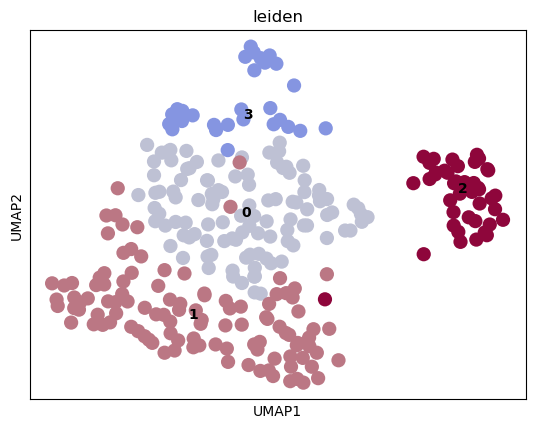

In [175]:
sc.pl.umap(adata_fibroblasts, color=["leiden"], legend_loc='on data')

In [177]:
sc.tl.rank_genes_groups(adata_fibroblasts, groupby="leiden", method="wilcoxon")

In [179]:
df = sc.get.rank_genes_groups_df(adata_fibroblasts, group=None)
top10_fibroblast_gene_per_cluster = df.groupby("group").head(10)
top10_fibroblast_gene_per_cluster.to_csv("results/top_fibroblast_genes_per_cluster.csv", index=False)

In [181]:
david_blast_results = pd.read_csv('results/chart_fibroblasts.csv')

In [182]:
david_blast_results = david_blast_results.drop(columns=["Category"])

# Clean the 'Term' to remove GO IDs (optional)
david_blast_results['CleanTerm'] = david_blast_results['Term'].str.split('~').str[-1]

# Convert p-values
david_blast_results['log10P'] = -np.log10(david_blast_results['PValue'])

# Sort for plotting
david_blast_results = david_blast_results.sort_values('log10P', ascending=False)

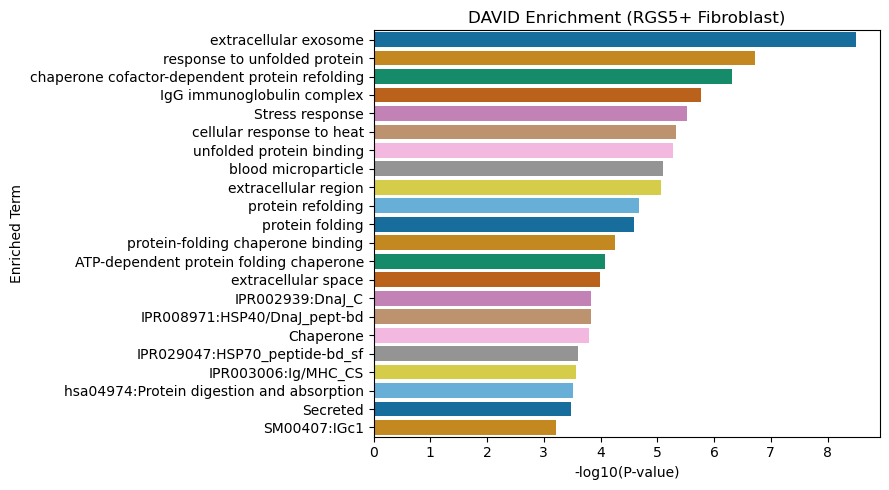

In [185]:

plt.figure(figsize=(9, 5))
sns.barplot(data=david_blast_results, y='CleanTerm', x='log10P', palette='colorblind')

plt.xlabel('-log10(P-value)')
plt.ylabel('Enriched Term')
plt.title('DAVID Enrichment (RGS5+ Fibroblast)')
plt.tight_layout()
plt.show()


## Discussion

Given the repeated terms about response to stress, it would be interesting to further investigate if these fiboblasts stress-activated, potentilly dysfunctional or recruiting other cancerous cells, or if they are part of the repair in the cells. Stress, especially in the TME, can activate certain metastatic pathways in cancer, and it would be interesting to see if RGS5+ cells have a similar expression in other cancers. Kalli et al note specifically in pancreatic cancer, stress-activated fibrroblasts can promote cell migration, thus leading to metastasis. 

Kalli M, Papageorgis P, Gkretsi V, Stylianopoulos T. Solid Stress Facilitates Fibroblasts Activation to Promote Pancreatic Cancer Cell Migration. Ann Biomed Eng. 2018;46(5):657-669. doi:10.1007/s10439-018-1997-7

DAVID tool:
B.T. Sherman, M. Hao, J. Qiu, X. Jiao, M.W. Baseler, H.C. Lane, T. Imamichi and W. Chang. DAVID: a web server for functional enrichment analysis and functional annotation of gene lists (2021 update). Nucleic Acids Research. 23 March 2022. doi:10.1093/nar/gkac194.[PubMed]

Huang DW, Sherman BT, Lempicki RA. Systematic and integrative analysis of large gene lists using DAVID Bioinformatics Resources. Nature Protoc. 2009;4(1):44-57.  [PubMed]